In [39]:
import pandas as pd
import numpy as np
import seaborn as sb
import plotly.express as px
import matplotlib.pyplot as plt
import warnings
import folium
#import geopandas
from mitosheet import sheet
import dtale
import missingno as msno
%matplotlib inline
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [53]:
df = pd.read_csv("cleaned_data.csv")
df.head(3)

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),mon_year,unemployement_rate
0,I192068249,2647,other,threats to do bodily harm,B2,280,0,2015-08-28,2015,8,Friday,10,Part Two,washington st,42.330119,-71.084251,"(42.33011862, -71.08425106)",summer,26.444444,-3.086420,1.58,0.0,2015-8,0.0
1,I192061894,1106,confidence games,fraud - credit card / atm fraud,C11,356,0,2015-08-20,2015,8,Thursday,0,Part Two,charles st,42.300605,-71.061268,"(42.30060543, -71.06126785)",summer,26.444444,-3.086420,1.58,0.0,2015-8,0.0
2,I192038828,1107,fraud,fraud - impersonation,A1,172,0,2015-11-02,2015,11,Monday,12,Part Two,albany st,42.334288,-71.072395,"(42.33428841, -71.07239518)",fall,10.722222,-11.820988,1.80,1.3,2015-11,3.7


In [54]:
df.drop('mon_year', axis = 1, inplace = True)

In [55]:
len(list(df.hour.unique()))

24

In [56]:
df['Day'] = 0
df['Night'] = 0

df['Day'].loc[(df['hour'] >= 6) & (df['hour'] <= 18)] = 1
df['Night'].loc[df['Day']==0]=1


In [57]:
df

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),unemployement_rate,Day,Night
0,I192068249,2647,other,threats to do bodily harm,B2,280,0,2015-08-28,2015,8,Friday,10,Part Two,washington st,42.330119,-71.084251,"(42.33011862, -71.08425106)",summer,26.444444,-3.086420,1.58,0.0,0.0,1,0
1,I192061894,1106,confidence games,fraud - credit card / atm fraud,C11,356,0,2015-08-20,2015,8,Thursday,0,Part Two,charles st,42.300605,-71.061268,"(42.30060543, -71.06126785)",summer,26.444444,-3.086420,1.58,0.0,0.0,0,1
2,I192038828,1107,fraud,fraud - impersonation,A1,172,0,2015-11-02,2015,11,Monday,12,Part Two,albany st,42.334288,-71.072395,"(42.33428841, -71.07239518)",fall,10.722222,-11.820988,1.80,1.3,3.7,1,0
3,I192008877,1107,fraud,fraud - impersonation,E18,525,0,2015-07-31,2015,7,Friday,10,Part Two,wingate rd,42.237009,-71.129566,"(42.23700950, -71.12956606)",summer,26.666667,-2.962963,4.03,0.0,0.0,1,0
4,I182090828,1102,fraud,fraud - false pretense / scheme,D4,159,0,2015-12-01,2015,12,Tuesday,12,Part Two,upton st,42.342432,-71.072258,"(42.34243222, -71.07225766)",winter,2.555556,-16.358025,2.49,9.2,3.7,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581779,210700265,3125,warrant arrest - boston warrant (must be supplemental),warrant arrest - boston warrant (must be supplemental),B3,476,0,2022-04-05,2022,4,Tuesday,6,Part Three,cummins hwy,42.268642,-71.095655,"(42.268642296887826, -71.09565499637984)",spring,15.444444,-9.197531,5.73,1.2,0.0,1,0
581780,149210376,3110,service to other agency,service to other agency,B2,,0,2022-01-02,2022,1,Sunday,0,Part Three,washington st & roxbury st\nboston ma 02119\nunited,42.329600,-71.084620,"(42.32959998129787, -71.08462000476281)",winter,5.000000,-15.000000,4.25,8.9,0.0,0,1
581781,122056850,3801,m/v accident - other,m/v accident - other,D4,271,0,2022-07-28,2022,7,Thursday,19,Part Three,massachusetts ave & harrison ave\nboston ma 02118\n,42.334910,-71.075170,"(42.334909956083834, -71.07517004893332)",summer,26.666667,-2.962963,4.03,0.0,0.0,0,1
581782,122004001,3115,investigate person,investigate person,E13,912,0,2022-01-19,2022,1,Wednesday,9,Part Three,heath st,42.325131,-71.099408,"(42.32513050637361, -71.09940814578592)",winter,5.000000,-15.000000,4.25,8.9,0.0,1,0


In [50]:
from folium.plugins import HeatMap
crime_map = folium.Map(location=[42.3125,-71.0875], zoom_start = 13)  

data_heatmap = df[['lat','long']]
#data_heatmap = df.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['lat'],row['long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=10).add_to(crime_map)

crime_map

In [40]:
df.groupby('hour').get_group(2)

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),mon_year,unemployment_rate,Day,Night
218,I152099929,413,aggravated assault,assault - aggravated - battery,A1,121,0,2015-11-29 02:00:00,2015,11,Sunday,2,Part One,warrenton st,42.350662,-71.066022,"(42.35066174, -71.06602232)",fall,10.722222,-11.820988,1.80,1.3,2015-11,3.7,0,1
477,I152098854,301,robbery,robbery - street,C11,342,0,2015-11-29 02:30:00,2015,11,Sunday,2,Part One,homes ave,42.302884,-71.069188,"(42.30288397, -71.06918798)",fall,10.722222,-11.820988,1.80,1.3,2015-11,3.7,0,1
669,I152098634,802,simple assault,assault simple - battery,D4,624,0,2015-11-29 02:00:00,2015,11,Sunday,2,Part Two,brookline ave,42.347462,-71.098266,"(42.34746241, -71.09826597)",fall,10.722222,-11.820988,1.80,1.3,2015-11,3.7,0,1
671,I152098632,3115,investigate person,investigate person,D14,798,0,2015-11-29 02:35:00,2015,11,Sunday,2,Part Three,commonwealth ave,42.352168,-71.124571,"(42.35216801, -71.12457096)",fall,10.722222,-11.820988,1.80,1.3,2015-11,3.7,0,1
672,I152098630,1402,vandalism,vandalism,A1,70,0,2015-11-29 02:51:00,2015,11,Sunday,2,Part Two,charles st,42.357396,-71.070089,"(42.35739591, -71.07008873)",fall,10.722222,-11.820988,1.80,1.3,2015-11,3.7,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140043,212087923,613,larceny shoplifting,larceny shoplifting,A1,,0,2021-12-02 02:14:00,2021,12,Thursday,2,Part One,charles st,42.360645,-71.070862,"(42.360644695548025, -71.07086192011141)",winter,2.555556,-16.358025,2.49,9.2,2021-12,3.7,0,1
140151,212087758,613,larceny shoplifting,larceny shoplifting,A1,,0,2021-12-01 02:30:00,2021,12,Wednesday,2,Part One,washington st,42.355123,-71.060880,"(42.355123390368036, -71.06087979851635)",winter,2.555556,-16.358025,2.49,9.2,2021-12,3.7,0,1
140374,212090075,617,larceny theft from building,larceny theft from building,D14,778,0,2021-12-09 02:57:00,2021,12,Thursday,2,Part One,washington st,42.349056,-71.150498,"(42.34905600030506, -71.15049849975023)",winter,2.555556,-16.358025,2.49,9.2,2021-12,3.7,0,1
140447,212089947,2905,val - violation of auto law,val - violation of auto law,D4,270,0,2021-12-09 02:15:00,2021,12,Thursday,2,Part Two,massachusetts ave,42.334219,-71.074346,"(42.334219417895525, -71.07434615707857)",winter,2.555556,-16.358025,2.49,9.2,2021-12,3.7,0,1


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581784 entries, 0 to 581783
Data columns (total 25 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   incident_number             581784 non-null  object 
 1   offense_code                581784 non-null  int64  
 2   offense_code_group          581784 non-null  object 
 3   offense_description         581784 non-null  object 
 4   district                    581784 non-null  object 
 5   reporting_area              581784 non-null  object 
 6   shooting                    581784 non-null  int64  
 7   occurred_on_date            581784 non-null  object 
 8   year                        581784 non-null  int64  
 9   month                       581784 non-null  int64  
 10  day_of_week                 581784 non-null  object 
 11  hour                        581784 non-null  int64  
 12  ucr_part                    581784 non-null  object 
 13  street        

In [58]:
df.shape

(581784, 25)

In [72]:
df[df.street == 'columbia road']

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,...,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),mon_year,unemployment_rate
107251,192087664,2670,harassment/ criminal harassment,harassment/ criminal harassment,B2,258,0,2019-10-29 16:24:00,2019,10,...,42.315142,-71.067047,"(42.31514178542719, -71.06704709164646)",fall,20.500000,-6.388889,4.14,0.0,2019-10,2.4
112298,202082385,1501,weapon violation - carry/ possessing/ sale/ trafficking/ other,weapon violation - carry/ possessing/ sale/ trafficking/ other,C6,333,0,2020-11-07 17:53:00,2020,11,...,42.311339,-71.070241,"(42.3113389682479, -71.0702410017705)",fall,10.722222,-11.820988,1.80,1.3,2020-11,7.2


In [73]:
df[df.street == 'blue hill avenue']

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,...,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),mon_year,unemployment_rate
95630,192096334,3831,m/v - leaving scene - property damage,m/v - leaving scene - property damage,B2,337,0,2019-11-28 19:16:00,2019,11,...,42.305747,-71.077799,"(42.3057471572306, -71.07779901943985)",fall,10.722222,-11.820988,1.80,1.3,2019-11,2.3
102170,192080201,2646,liquor/alcohol - drinking in public,liquor/alcohol - drinking in public,B2,482,0,2019-10-04 10:11:00,2019,10,...,42.267264,-71.094611,"(42.26726416205867, -71.09461108569424)",fall,20.500000,-6.388889,4.14,0.0,2019-10,2.4
102483,192080683,801,assault - simple,assault - simple,B3,,0,2019-10-05 17:59:00,2019,10,...,42.291168,-71.089056,"(42.291167964872415, -71.089056001433)",fall,20.500000,-6.388889,4.14,0.0,2019-10,2.4
105515,192085199,3201,property - lost/ missing,property - lost/ missing,B3,399,0,2019-10-21 11:42:00,2019,10,...,42.286455,-71.069368,"(42.28645491853036, -71.06936781466095)",fall,20.500000,-6.388889,4.14,0.0,2019-10,2.4
110571,202084913,1108,fraud - welfare,fraud - welfare,B2,282,0,2020-11-16 14:00:00,2020,11,...,42.328663,-71.085634,"(42.3286628355561, -71.0856340118355)",fall,10.722222,-11.820988,1.80,1.3,2020-11,7.2
114813,202093899,3831,m/v - leaving scene - property damage,m/v - leaving scene - property damage,B2,329,0,2020-12-24 08:21:00,2020,12,...,42.309384,-71.082623,"(42.3093843741193, -71.0826227718332)",winter,2.555556,-16.358025,2.49,9.2,2020-12,6.9
116282,202091664,613,larceny shoplifting,larceny shoplifting,B3,476,0,2020-12-14 18:38:00,2020,12,...,42.269947,-71.093803,"(42.2699473161779, -71.0938030751921)",winter,2.555556,-16.358025,2.49,9.2,2020-12,6.9
122823,202074694,3831,m/v - leaving scene - property damage,m/v - leaving scene - property damage,B2,282,0,2020-10-10 15:33:00,2020,10,...,42.329259,-71.084824,"(42.3292590480433, -71.0848240207294)",fall,20.500000,-6.388889,4.14,0.0,2020-10,7.8


In [74]:
df.loc[np.where(df['location'] == 0.0)]['street'].nunique()

0

In [75]:
df.drop(df[df['lat'] == 0.0].index,axis = 0, inplace = True)

In [76]:
df.isnull().sum()

incident_number               0
offense_code                  0
offense_code_group            0
offense_description           0
district                      0
reporting_area                0
shooting                      0
occurred_on_date              0
year                          0
month                         0
day_of_week                   0
hour                          0
ucr_part                      0
street                        0
lat                           0
long                          0
location                      0
season                        0
avg_high_temp (C)             0
avg_low_temp (C)              0
avg_precipitation (inches)    0
snow (inches)                 0
mon_year                      0
unemployment_rate             0
dtype: int64

In [60]:
df.duplicated().sum()

615

In [62]:
df.drop_duplicates(inplace = True)

In [63]:
df.shape

(581169, 25)

In [64]:
df.head()

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),unemployement_rate,Day,Night
0,I192068249,2647,other,threats to do bodily harm,B2,280,0,2015-08-28,2015,8,Friday,10,Part Two,washington st,42.330119,-71.084251,"(42.33011862, -71.08425106)",summer,26.444444,-3.086420,1.58,0.0,0.0,1,0
1,I192061894,1106,confidence games,fraud - credit card / atm fraud,C11,356,0,2015-08-20,2015,8,Thursday,0,Part Two,charles st,42.300605,-71.061268,"(42.30060543, -71.06126785)",summer,26.444444,-3.086420,1.58,0.0,0.0,0,1
2,I192038828,1107,fraud,fraud - impersonation,A1,172,0,2015-11-02,2015,11,Monday,12,Part Two,albany st,42.334288,-71.072395,"(42.33428841, -71.07239518)",fall,10.722222,-11.820988,1.80,1.3,3.7,1,0
3,I192008877,1107,fraud,fraud - impersonation,E18,525,0,2015-07-31,2015,7,Friday,10,Part Two,wingate rd,42.237009,-71.129566,"(42.23700950, -71.12956606)",summer,26.666667,-2.962963,4.03,0.0,0.0,1,0
4,I182090828,1102,fraud,fraud - false pretense / scheme,D4,159,0,2015-12-01,2015,12,Tuesday,12,Part Two,upton st,42.342432,-71.072258,"(42.34243222, -71.07225766)",winter,2.555556,-16.358025,2.49,9.2,3.7,1,0


# Univariate Analysis 

In [65]:
df.offense_code.nunique()

216

In [66]:
df.offense_code.value_counts().nunique()

176

<function matplotlib.pyplot.show(close=None, block=None)>

findfont: Font family ['Heiti TC'] not found. Falling back to DejaVu Sans.


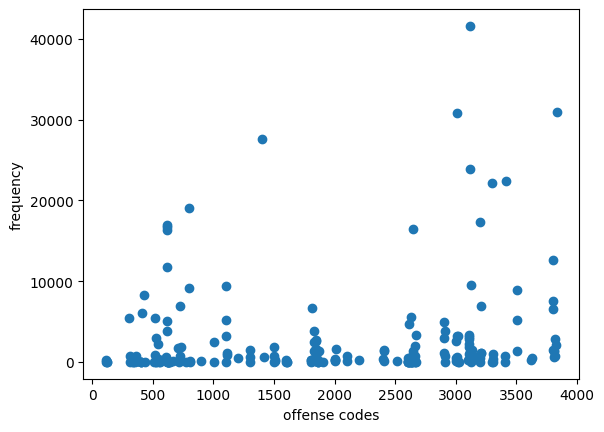

In [67]:
x,y = np.unique(df.offense_code, return_counts = True)
plt.scatter(x,y)
plt.xlabel('offense codes')
plt.ylabel("frequency")
plt.show

#### Conclusion : The crimes ranging with offense_code that are in UCR part three are committed more than other level of crimes.
#### UCR-I -> Serious crimes like murders, rapes, mass killings etc.
#### UCR-II -> Intermediate crimes like Fraud and confidence games.
#### UCR-III -> Low level crimes like verbal abuse.

findfont: Font family ['Heiti TC'] not found. Falling back to DejaVu Sans.


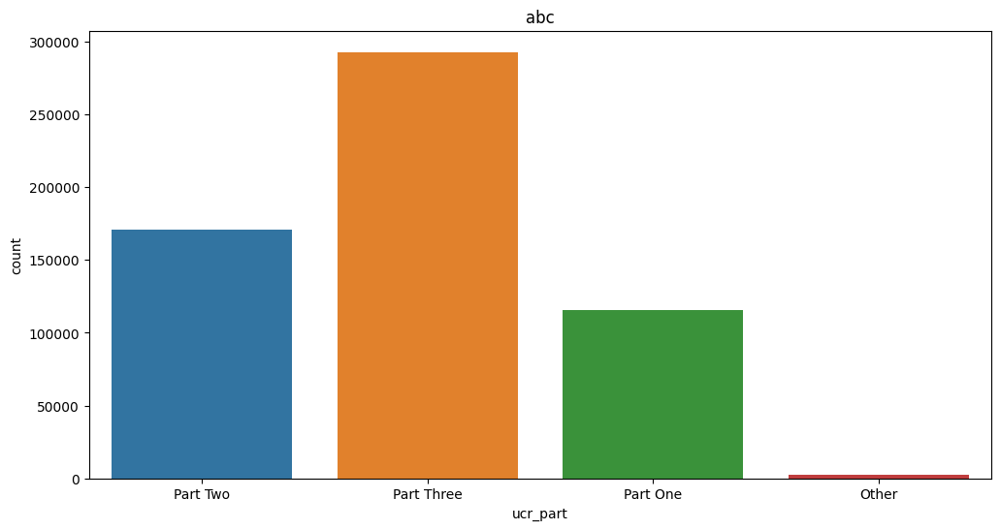

In [68]:
plt.figure(figsize= (12,6))
sb.countplot(data = df,x = 'ucr_part')
plt.title("abc")
plt.show()

### Conclusion :  UCR-III crimes are more common

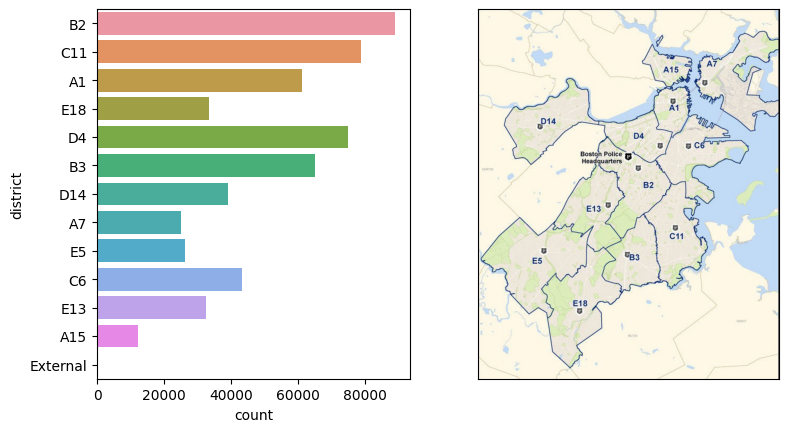

In [69]:
plt.subplot(1,2,1)
sb.countplot(data = df, y = 'district')
plt.subplots_adjust(right = 1.2)
plt.subplot(1,2,2)
plt.imshow(plt.imread("boston districts.jpg"))
plt.tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False)

### District B2 has high crime rate and A15 has lowest

<AxesSubplot:xlabel='count', ylabel='day_of_week'>

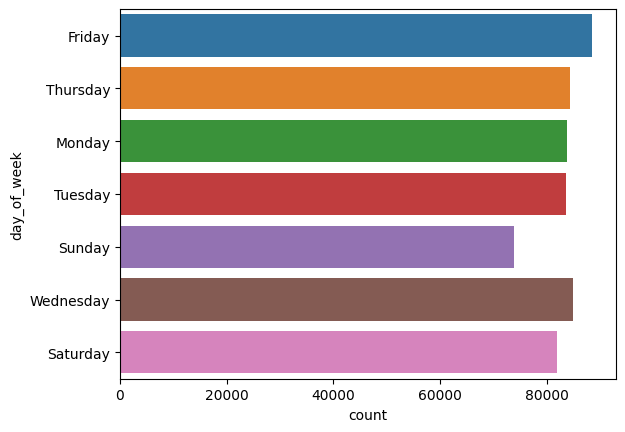

In [70]:
sb.countplot(data = df, y = 'day_of_week')

### conclusion-it is observed that on friday the crimes are commited more

<AxesSubplot:xlabel='count', ylabel='offense_description'>

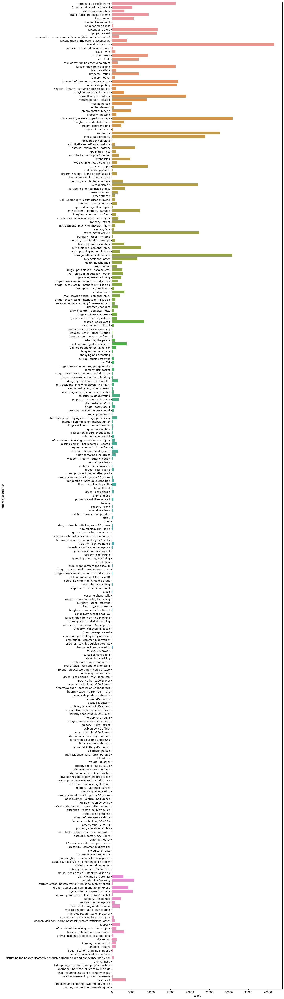

In [71]:
plt.figure(figsize = (12,70))
sb.countplot(data = df, y = "offense_description")

<AxesSubplot:xlabel='shooting', ylabel='count'>

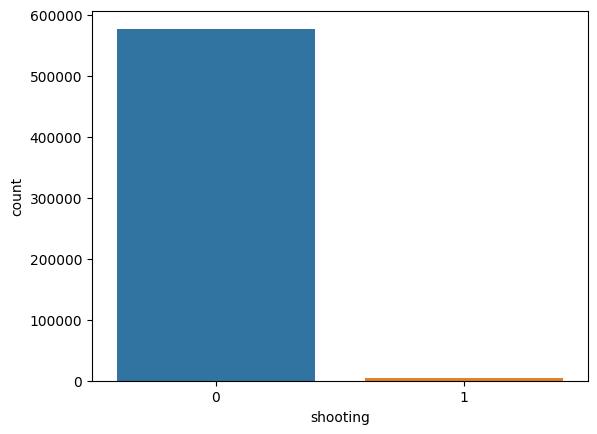

In [72]:
sb.countplot(data = df,x = 'shooting')

### Conclusion - Shooting cases are very low due to the ban on using firearms in boston. 

<AxesSubplot:xlabel='year', ylabel='count'>

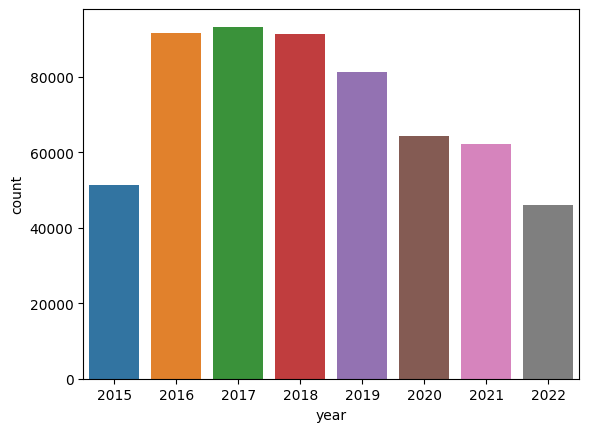

In [73]:
sb.countplot(data = df, x = 'year')


<AxesSubplot:xlabel='count', ylabel='month'>

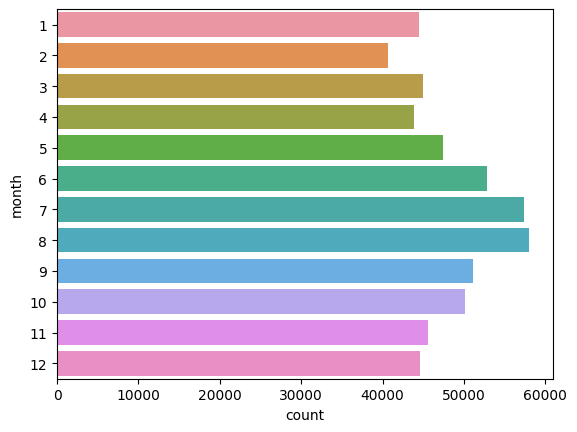

In [74]:
sb.countplot(data = df, y = 'month')

### conclusion- In the month of August the crime is commited more

<AxesSubplot:xlabel='count', ylabel='day_of_week'>

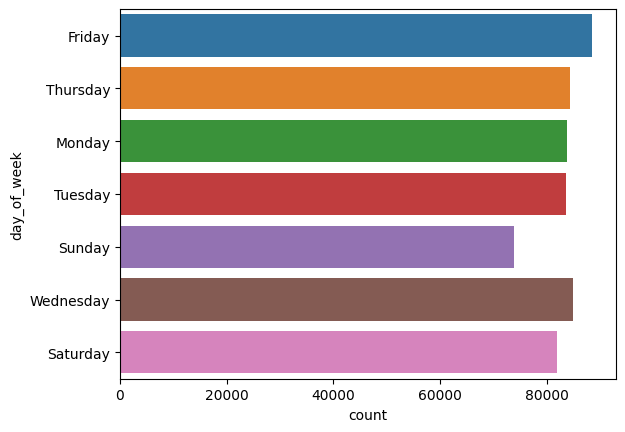

In [75]:
sb.countplot(data = df, y = 'day_of_week')


<AxesSubplot:xlabel='count', ylabel='hour'>

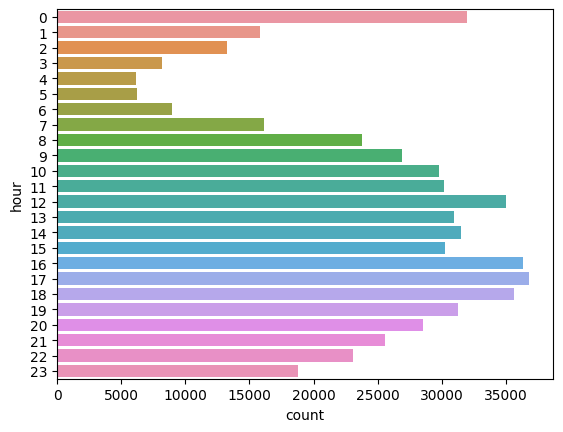

In [76]:
sb.countplot(data = df, y = 'hour')

### conclusion-crime is commited more  at the 17th hour

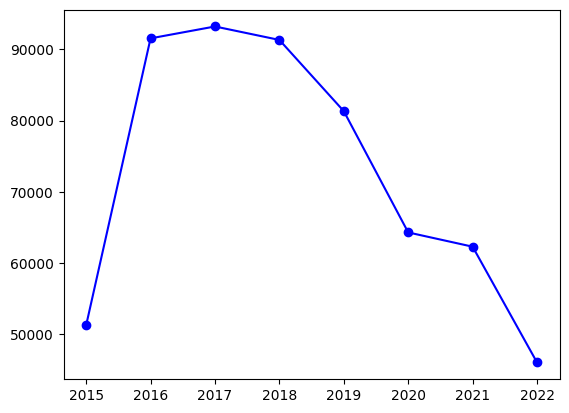

In [77]:
x,y = np.unique(df.year, return_counts = True)
plt.plot(x,y,'bo-')


<AxesSubplot:xlabel='season', ylabel='count'>

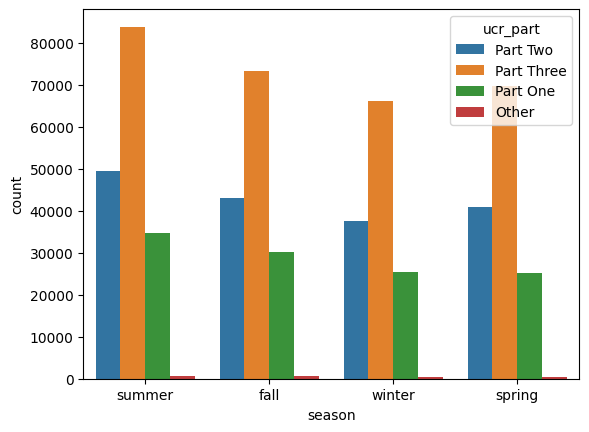

In [78]:
sb.countplot(data = df, x = 'season', hue = 'ucr_part')

# Bivariate 

In [79]:
df_2015 = df.groupby('year').get_group(2015)
df_2016 = df.groupby('year').get_group(2016)
df_2017 = df.groupby('year').get_group(2017)
df_2018 = df.groupby('year').get_group(2018)
df_2019 = df.groupby('year').get_group(2019)
df_2020 = df.groupby('year').get_group(2020)
df_2021 = df.groupby('year').get_group(2021)
df_2022 = df.groupby('year').get_group(2022)

In [80]:
yearwise_data = [df_2015, df_2016, df_2017, df_2018, df_2019, df_2020, df_2021, df_2022]
l = ["df_2015", "df_2016", "df_2017", "df_2018", "df_2019", "df_2020", "df_2021", "df_2022"]

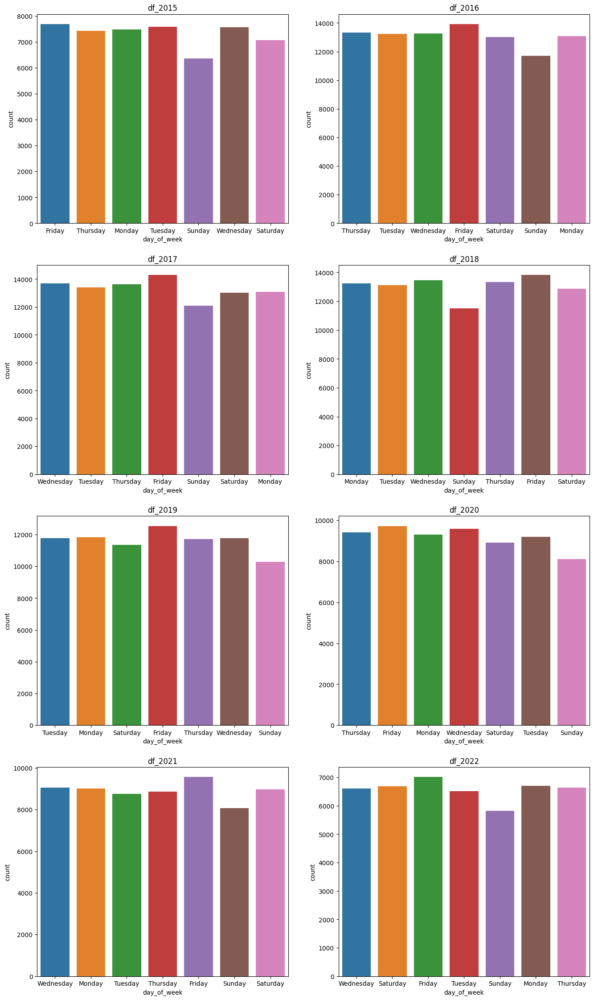

In [81]:
plt.figure(figsize = (16,28))
for i in range(len(yearwise_data)):
    plt.subplot(4,2, i+1)
    sb.countplot(data = yearwise_data[i], x = "day_of_week")
    plt.title(l[i])

### conclusion - it is observed that from 2015-22 the crime is commited mostly on friday and then on wednesday likewise on thursday
### In the year 2015 the frequency of crime has reached approx 8000.
### In the year 2016-18 onwards it has reached to 14000.
### In the year 2019 it has reached to 12000.
### In the year 2020-21 the crime has  gradually decreased to 10000. 
### In the year 2022 the crime rate has decreased to 7000.

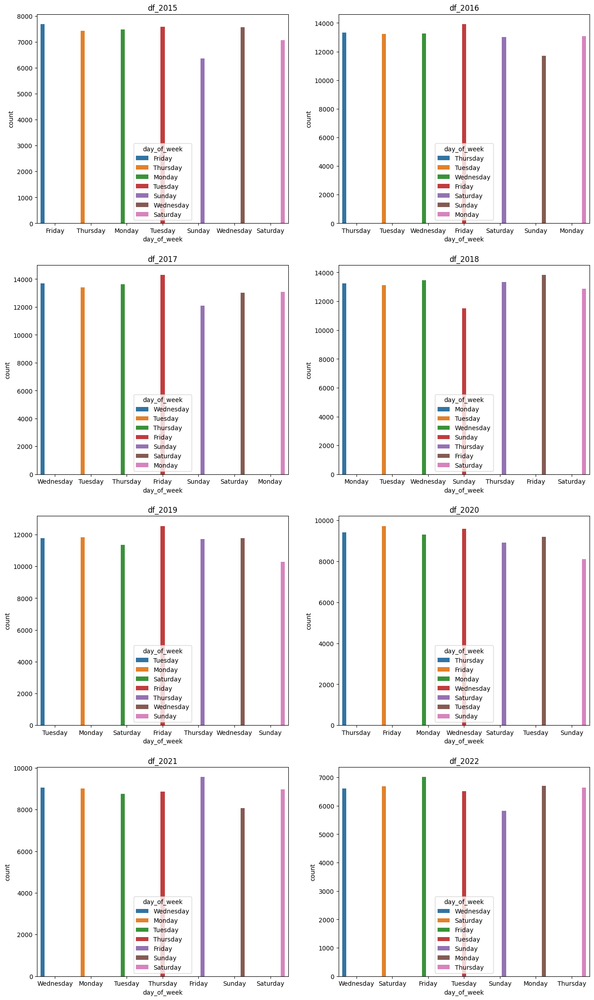

In [82]:
plt.figure(figsize = (16,28))
for i in range(len(yearwise_data)):
    plt.subplot(4,2, i+1)
    sb.countplot(data = yearwise_data[i], x = "day_of_week", hue = 'day_of_week')
    plt.title(l[i])

In [83]:
a = px.scatter_geo(df, 'lat', "long")

In [84]:
df.groupby('ucr_part')["district"]

<AxesSubplot:xlabel='count', ylabel='district'>

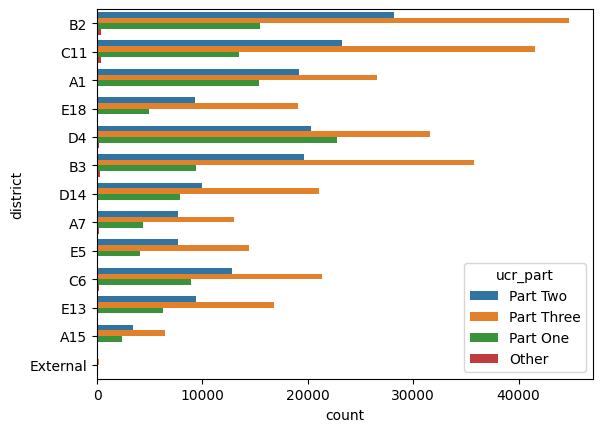

In [85]:
sb.countplot(data = df, y = df.district, hue = 'ucr_part')

### conclusion-the part 3 crime indicated with orange color in above graph is high in every district 

<AxesSubplot:xlabel='count', ylabel='day_of_week'>

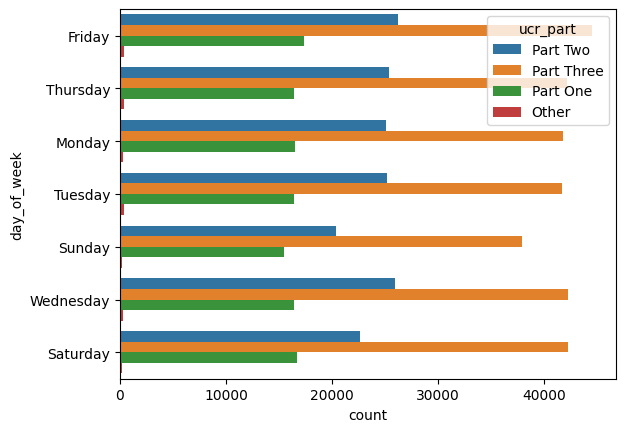

In [86]:
sb.countplot(data = df, y = df.day_of_week, hue = 'ucr_part')

### The part 3 crime is commited more  on friday

In [87]:
df.groupby('district').get_group('B2')['street'].unique()

array(['washington st', 'columbia rd', 'fayston st', ...,
       'ritchie st & slayton way\nboston  ma 02119\nunited s',
       'quincy st & warren st\nboston  ma 02121\nunited stat',
       'e cottage st & columbia rd\nboston  ma 02125\nunited'],
      dtype=object)

In [88]:
print(min(df['long']), max(df['long']))
print(min(df['lat']), max(df['lat']))


-71.34946994725333 -70.9537263645748
42.21440996169888 42.46141002105424


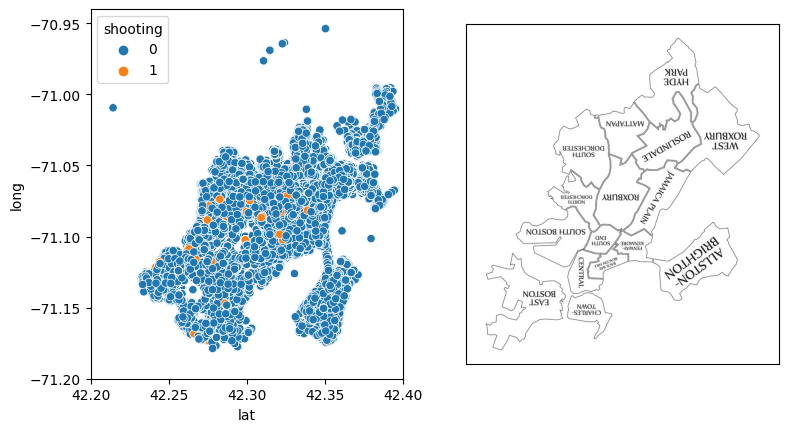

In [89]:
plt.subplot(1,2,1)
sb.scatterplot(data = df, x = 'lat', y = 'long', hue = 'shooting')
plt.xlim([42.20,42.4])
plt.ylim([-71.2,-70.94])
plt.subplots_adjust(right = 1.2)
plt.subplot(1,2,2)
bg = plt.imread("boston.jpeg")
plt.imshow(bg,alpha = 1)
plt.tick_params(left = False, right = False, labelleft = False, labelbottom = False, bottom = False)

### conclusion-The blue color indicates shooting rate is 0,since the Boston has banned the guns.
The shooting rate is 1 at Roxbury and its surrounding Districts which is indicated by orange color.

(-71.2, -70.94)

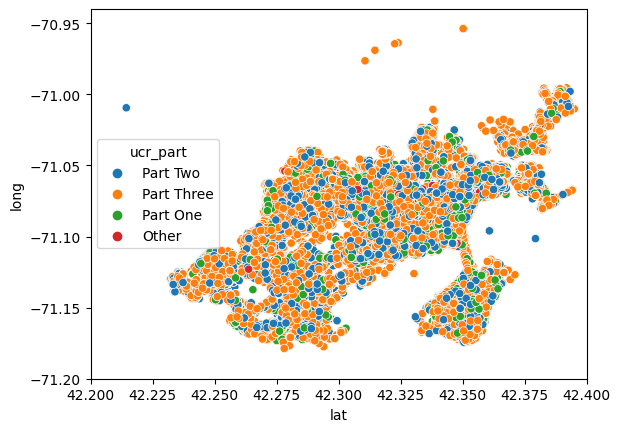

In [90]:
sb.scatterplot(data = df, x = 'lat', y = 'long', hue = 'ucr_part')
plt.xlim([42.20,42.4])
plt.ylim([-71.2,-70.94])

### Conclusion- It is observed that Part three crime is committed more

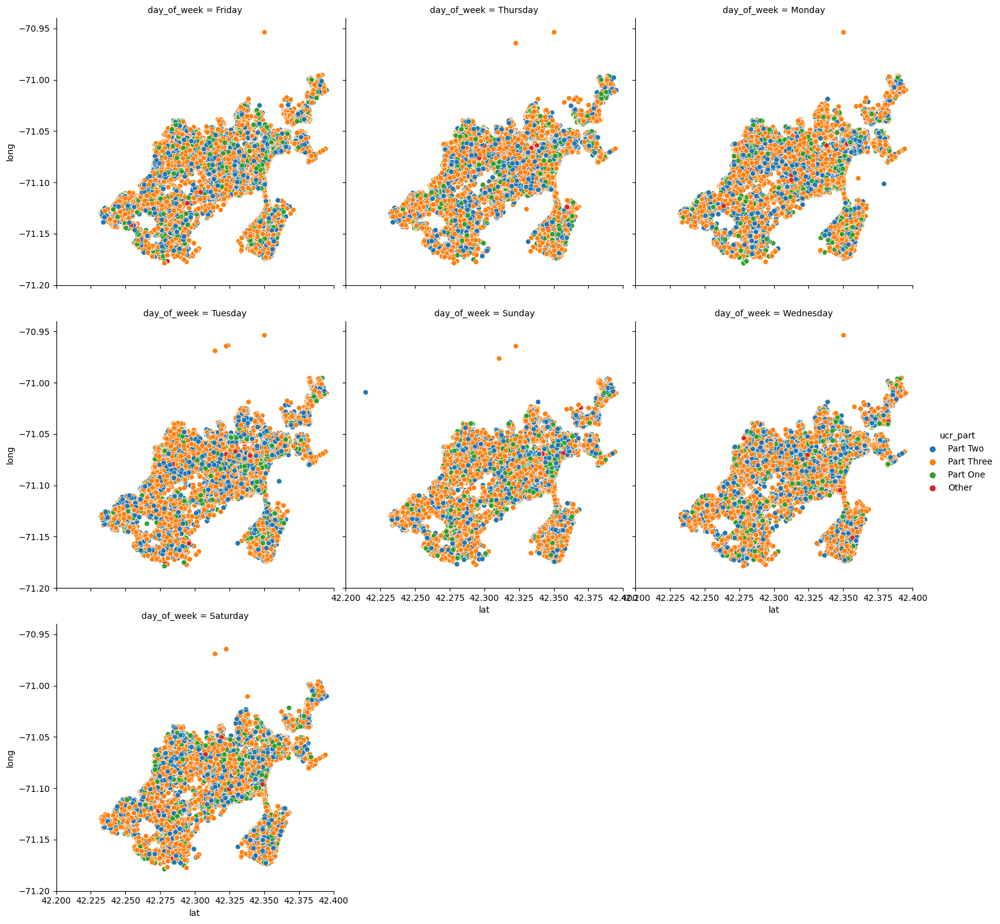

In [91]:
sb.relplot(data = df, x = 'lat', y = 'long',hue = 'ucr_part', col = 'day_of_week', height = 5, col_wrap = 3 )
plt.xlim([42.20,42.4])
plt.ylim([-71.2,-70.94])
plt.show()

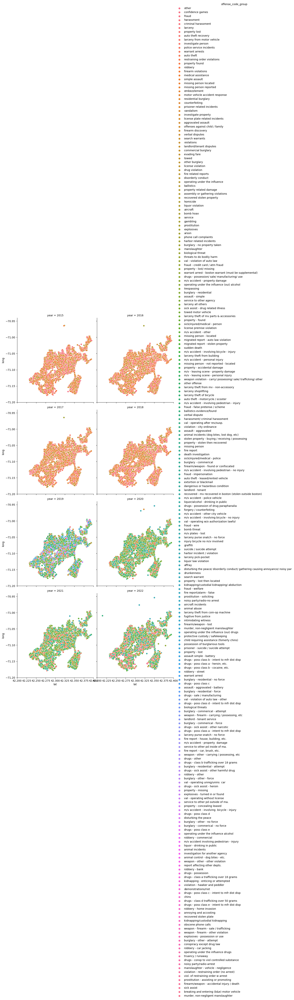

In [92]:
sb.relplot(data = df, x = 'lat', y = 'long',hue = 'offense_code_group', col = 'year', height = 5, col_wrap = 2)
plt.xlim([42.20,42.4])
plt.ylim([-71.2,-70.94])
plt.show()

In [93]:
df.ucr_part.value_counts()

Part Three    292752
Part Two      170879
Part One      115365
Other           2173
Name: ucr_part, dtype: int64

In [94]:
df.shape

(581169, 25)

In [95]:
df.to_csv('forModel.csv', index = False)